In [22]:
import pandas as pd
import numpy as np
%matplotlib inline
import sklearn.model_selection as cv
import sklearn

# 1. Import data and transform to numeric values

In [23]:
## Load dataset
data = pd.read_csv("datapreprocessed.csv", encoding='latin1')
data.head()

,gender,created,description_length,fav_number,link_color,name_length,retweet_count,sidebar_color,text_length,tweet_coord,tweet_count,tweet_created,tweet_location,user_timezone
0,male,early_morning,21,0,cyan,7,0,white,109,False,110964,midday,Unknown,Chennai
1,male,midday,62,68,gray,11,0,white,139,False,7471,midday,Unknown,Eastern Time (US & Canada)
2,male,morning,35,7696,gray,14,1,white,80,False,5617,midday,India,Belgrade
3,male,evening,146,202,gray,11,0,white,138,False,1693,midday,United States,Pacific Time (US & Canada)
4,female,midday,160,37318,lightblue,12,0,black,95,False,31462,midday,Unknown,Unknown


In [24]:
def expand_categoric_column_with_binary_values(column_name):
    global data
    print(column_name)
    print(data[column_name].unique())
    data = pd.concat([
            data.drop(column_name, axis=1),
            pd.get_dummies(data[column_name], prefix=column_name, sparse=True)
        ], axis=1)

expand_categoric_column_with_binary_values('created')
expand_categoric_column_with_binary_values('tweet_created')
expand_categoric_column_with_binary_values('link_color')
expand_categoric_column_with_binary_values('sidebar_color')
expand_categoric_column_with_binary_values('tweet_location')
expand_categoric_column_with_binary_values('user_timezone')

data.head()

created
['early_morning' 'midday' 'morning' 'evening' 'afternoon']
tweet_created
['midday']
link_color
['cyan' 'gray' 'lightblue' 'lightred' 'blue' 'black' 'violet' 'red'
 'orange' 'brown' 'green' 'lightgreen' 'white' 'yellow']
sidebar_color
['white' 'black' 'lightblue' 'orange' 'lightgreen' 'gray' 'lightred' 'cyan'
 'red' 'brown' 'blue' 'yellow' 'violet' 'green']
tweet_location
['Unknown' 'India' 'United States' 'United Kingdom' 'Canada' 'Haiti'
 'Saudi Arabia' 'Venezuela' 'Italy' 'Malaysia' 'Ireland' 'Poland' 'Spain'
 'Belgium' 'Nigeria' 'Portugal' 'South Africa' 'New Zealand' 'France'
 'Lebanon' 'Dominican Republic' 'Germany' 'Australia' 'Czechia' 'Croatia'
 'Indonesia' 'Swaziland' 'Paraguay' 'Mexico' 'Ecuador' 'South Korea'
 'Turkey' 'Syria' 'Greenland' 'Botswana' 'Brazil' 'Tunisia' 'Colombia'
 'Greece' 'Trinidad and Tobago' 'Bangladesh' 'Somalia' 'Netherlands'
 'Sweden' 'Hong Kong' 'Argentina' 'Japan' 'Egypt' 'Israel' 'Bolivia'
 'Bosnia & Herzegovina' 'Sri Lanka' 'North Africa' 'U

,gender,description_length,fav_number,name_length,retweet_count,text_length,tweet_coord,tweet_count,created_afternoon,created_early_morning,...,user_timezone_Urumqi,user_timezone_Vienna,user_timezone_Vilnius,user_timezone_Volgograd,user_timezone_Warsaw,user_timezone_Wellington,user_timezone_West Central Africa,user_timezone_Yakutsk,user_timezone_Yerevan,user_timezone_Zagreb
0,male,21,0,7,0,109,False,110964,0,1,...,0,0,0,0,0,0,0,0,0,0
1,male,62,68,11,0,139,False,7471,0,0,...,0,0,0,0,0,0,0,0,0,0
2,male,35,7696,14,1,80,False,5617,0,0,...,0,0,0,0,0,0,0,0,0,0
3,male,146,202,11,0,138,False,1693,0,0,...,0,0,0,0,0,0,0,0,0,0
4,female,160,37318,12,0,95,False,31462,0,0,...,0,0,0,0,0,0,0,0,0,0


In [25]:
def boolean_to_binary(column_name):
    global data
    data[column_name] = data[column_name].apply(lambda boolean: int(boolean))

boolean_to_binary('tweet_coord')

data.tweet_coord.sum()

157

In [26]:
# All values must be numeric, label included
def genderToNumeric(gender) :
    if gender == 'male' :
        return 0
    elif gender == 'female' :
        return 1
    else :
        return 2


labels = data.gender.apply(lambda g: genderToNumeric(g))
datadt = data.drop('gender', axis=1)

print(data.shape)
datadt.head()

(18836, 332)


,description_length,fav_number,name_length,retweet_count,text_length,tweet_coord,tweet_count,created_afternoon,created_early_morning,created_evening,...,user_timezone_Urumqi,user_timezone_Vienna,user_timezone_Vilnius,user_timezone_Volgograd,user_timezone_Warsaw,user_timezone_Wellington,user_timezone_West Central Africa,user_timezone_Yakutsk,user_timezone_Yerevan,user_timezone_Zagreb
0,21,0,7,0,109,0,110964,0,1,0,...,0,0,0,0,0,0,0,0,0,0
1,62,68,11,0,139,0,7471,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,35,7696,14,1,80,0,5617,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,146,202,11,0,138,0,1693,0,0,1,...,0,0,0,0,0,0,0,0,0,0
4,160,37318,12,0,95,0,31462,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [27]:
data[data.gender.isnull()]

,gender,description_length,fav_number,name_length,retweet_count,text_length,tweet_coord,tweet_count,created_afternoon,created_early_morning,...,user_timezone_Urumqi,user_timezone_Vienna,user_timezone_Vilnius,user_timezone_Volgograd,user_timezone_Warsaw,user_timezone_Wellington,user_timezone_West Central Africa,user_timezone_Yakutsk,user_timezone_Yerevan,user_timezone_Zagreb


In [28]:
# Cross-validation: split data into training and test sets (test 30% of data)
data_train, data_test, labels_train, labels_test = cv.train_test_split(datadt, labels, test_size=.3, random_state=1)

In [29]:
data_train.info()
data.iloc[data_train.head().index]

<class 'pandas.core.frame.DataFrame'>
Int64Index: 13185 entries, 17267 to 235
Columns: 331 entries, description_length to user_timezone_Zagreb
dtypes: int64(7), uint8(324)
memory usage: 4.9 MB


,gender,description_length,fav_number,name_length,retweet_count,text_length,tweet_coord,tweet_count,created_afternoon,created_early_morning,...,user_timezone_Urumqi,user_timezone_Vienna,user_timezone_Vilnius,user_timezone_Volgograd,user_timezone_Warsaw,user_timezone_Wellington,user_timezone_West Central Africa,user_timezone_Yakutsk,user_timezone_Yerevan,user_timezone_Zagreb
17267,brand,82,0,14,0,134,0,7014,0,0,...,0,0,0,0,0,0,0,0,0,0
14303,male,159,249,14,0,137,0,359,0,0,...,0,0,0,0,0,0,0,0,0,0
11018,female,3,14271,9,0,110,0,87773,0,0,...,0,0,0,0,0,0,0,0,0,0
9068,male,33,19357,14,1,42,0,17575,0,0,...,0,0,0,0,0,0,0,0,0,0
8696,female,97,40,7,0,57,0,18238,0,0,...,0,0,0,0,0,0,0,0,0,0


In [30]:
data_test.info()
data.iloc[data_test.head().index]

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5651 entries, 11871 to 18258
Columns: 331 entries, description_length to user_timezone_Zagreb
dtypes: int64(7), uint8(324)
memory usage: 2.1 MB


,gender,description_length,fav_number,name_length,retweet_count,text_length,tweet_coord,tweet_count,created_afternoon,created_early_morning,...,user_timezone_Urumqi,user_timezone_Vienna,user_timezone_Vilnius,user_timezone_Volgograd,user_timezone_Warsaw,user_timezone_Wellington,user_timezone_West Central Africa,user_timezone_Yakutsk,user_timezone_Yerevan,user_timezone_Zagreb
11871,female,3,69,12,0,98,0,12264,0,0,...,0,0,0,0,0,0,0,0,0,0
7136,brand,3,0,9,0,54,0,79914,0,0,...,0,0,0,0,0,0,0,0,0,0
13818,male,46,6021,9,1,91,0,49095,0,1,...,0,0,0,0,0,0,0,0,0,0
5231,brand,79,0,11,0,125,0,47600,0,1,...,0,0,0,0,0,0,0,0,0,0
1005,brand,145,90,11,0,99,0,3938,1,0,...,0,0,0,0,0,0,0,0,0,0


# 2. Implement DT without parameters optimization

In [31]:
from sklearn import tree
from sklearn.externals.six import StringIO  
import pydot
from IPython.display import Image 
from statsmodels.stats.proportion import proportion_confint

clf = tree.DecisionTreeClassifier(criterion='entropy')
pred = clf.fit(data_train, labels_train).predict(data_test)
print(sklearn.metrics.confusion_matrix(labels_test, pred))
print()
print("Accuracy on test set:", sklearn.metrics.accuracy_score(labels_test, pred))
print()
print(sklearn.metrics.classification_report(labels_test, pred))
epsilon = sklearn.metrics.accuracy_score(labels_test, pred)
print("Confidence interval: ",proportion_confint(count=epsilon*data_test.shape[0], nobs=data_test.shape[0], alpha=0.05, method='binom_test'))

[[ 788  636  391]
 [ 711  989  331]
 [ 441  330 1034]]

Accuracy on test set: 0.497434082463

             precision    recall  f1-score   support

          0       0.41      0.43      0.42      1815
          1       0.51      0.49      0.50      2031
          2       0.59      0.57      0.58      1805

avg / total       0.50      0.50      0.50      5651

Confidence interval:  (0.48433824209341136, 0.5105296552032735)


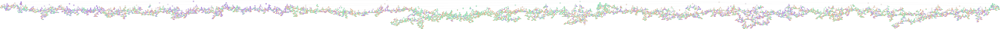

In [32]:
dot_data = StringIO() 
tree.export_graphviz(clf, out_file=dot_data,    
                         filled=True, rounded=True, 
                         special_characters=True)  
graph = pydot.graph_from_dot_data(dot_data.getvalue())  
graph[0].write_pdf('DT1a.pdf')
Image(graph[0].create_png())  

# 3. Implement DT with parameters optimization

In [33]:
from sklearn.model_selection import GridSearchCV
params = {'min_impurity_split': list(np.linspace(0,1,21)),'min_samples_split':list(range(2,102,11))}
clf = GridSearchCV(tree.DecisionTreeClassifier(criterion='entropy'), param_grid=params,cv=10,n_jobs=-1)  # If cv is integer, by default is Stratifyed 
clf.fit(data_train, labels_train)
print("Best Params=",clf.best_params_, "Accuracy=", clf.best_score_)

C:\Users\howar\Anaconda3\lib\site-packages\sklearn\tree\tree.py:282: DeprecationWarning: The min_impurity_split parameter is deprecated and will be removed in version 0.21. Use the min_impurity_decrease parameter instead.
  DeprecationWarning)


Best Params= {'min_impurity_split': 0.25, 'min_samples_split': 101} Accuracy= 0.518998862344


In [34]:
from sklearn import tree
from sklearn.externals.six import StringIO  
import pydot
from IPython.display import Image 
from statsmodels.stats.proportion import proportion_confint

# clf = tree.DecisionTreeClassifier(criterion='entropy', min_samples_split=clf.best_params_['min_samples_split'], min_impurity_split=clf.best_params_['min_impurity_split'])
clf = tree.DecisionTreeClassifier(criterion='entropy', min_samples_split=101, min_impurity_split=1.0)
pred = clf.fit(data_train, labels_train).predict(data_test)
print(sklearn.metrics.confusion_matrix(labels_test, pred))
print()
print("Accuracy on test set:", sklearn.metrics.accuracy_score(labels_test, pred))
print()
print(sklearn.metrics.classification_report(labels_test, pred))
epsilon = sklearn.metrics.accuracy_score(labels_test, pred)
print("Confidence interval: ",proportion_confint(count=epsilon*data_test.shape[0], nobs=data_test.shape[0], alpha=0.05, method='binom_test'))

C:\Users\howar\Anaconda3\lib\site-packages\sklearn\tree\tree.py:282: DeprecationWarning: The min_impurity_split parameter is deprecated and will be removed in version 0.21. Use the min_impurity_decrease parameter instead.
  DeprecationWarning)


[[ 828  649  338]
 [ 722 1031  278]
 [ 410  320 1075]]

Accuracy on test set: 0.519200141568

             precision    recall  f1-score   support

          0       0.42      0.46      0.44      1815
          1       0.52      0.51      0.51      2031
          2       0.64      0.60      0.61      1805

avg / total       0.52      0.52      0.52      5651

Confidence interval:  (0.5061054296514099, 0.5322968689143955)


In [37]:
from io import StringIO
dot_data = StringIO() 
tree.export_graphviz(clf, out_file=dot_data,    
                         filled=True, rounded=True,
                         feature_names=list(datadt.columns.values))
graph = pydot.graph_from_dot_data(dot_data.getvalue())  
graph[0].write_pdf('DT1b.pdf')
Image(graph[0].create_png())  